In [1]:
%%capture
!pip install ftfy regex tqdm
!pip install --no-deps retina-face

In [2]:
from pathlib import Path
import json
import numpy as np
import cv2
import matplotlib.pyplot as plt
from typing import Tuple, List, Iterator
from collections import OrderedDict

from retinaface import RetinaFace
import torch
import kornia.geometry as K
import kornia.color as C

2026-07-12 12:24:00.465306: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1783859040.651954      23 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1783859040.711430      23 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1783859041.170420      23 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1783859041.170459      23 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1783859041.170461      23 computation_placer.cc:177] computation placer alr

In [3]:
np.random.seed(42)

# Datapaths.
DATA_DIR = Path("/kaggle/input/datasets/ahmedelbanby/faceforensicsplusplus-c23-deepfakebench-structure/videos/FaceForensics++")
ORIGINAL_DATA_DIR = DATA_DIR / "original_sequences" / "youtube" / "c23" / "videos"
TEST_DATA_DIR = Path("/kaggle/input/datasets/pranay22077/dfdc-10")
OUT_DIR = Path("/kaggle/working")

# Data and train params.
DEEPFAKE_METHODS = ["Deepfakes", "Face2Face", "FaceShifter", "FaceSwap"]
N_DATA = 1000 # Number of examples per method.
N_TEST = 1000 # Number of test videos per class.
TOTAL_FRAMES = 32
IMG_DIMS = (224, 224)
SCALE = 1.3
DTYPE = torch.float32

## Data preprocessing

In [4]:
def get_pairs_ff(datapath: Path) -> List[Tuple[Path, Path]]:
    """
    Pairs each fake video from the path with its real counterpart.
    Args:
        datapath: Directory containing manipulated videos.

    Returns:
        A list of ``(fake_video, real_video)`` path pairs.
    """
    return [(x, ORIGINAL_DATA_DIR / (x.stem[:x.stem.find("_")] + ".mp4")) for x in datapath.iterdir()]


data_part = DATA_DIR / "manipulated_sequences" / DEEPFAKE_METHODS[0] / "c23" / "videos"
videos = {DEEPFAKE_METHODS[0]: get_pairs_ff(data_part)}

n = len(videos[DEEPFAKE_METHODS[0]])
print(f"There are {n} deepfake videos in the training dataset.")

There are 1000 deepfake videos in the training dataset.


In [5]:
# choose N_DATA random indices without replacement from 1 method.
# We then get all the others methods and the real video for those chosen videos.
chosen_indices = np.random.permutation(n)[:N_DATA]
chosen_pairs = [videos[DEEPFAKE_METHODS[0]][i] for i in chosen_indices]

# recuperate the paths of the other fake methods from the first one and add in the real video paths.
videos = [Path(str(x).replace(DEEPFAKE_METHODS[0], method)) for x, _ in chosen_pairs
        for method in DEEPFAKE_METHODS] + [y for _, y in chosen_pairs]

In [6]:
def sample_video(path: Path | str, n_frames: int = TOTAL_FRAMES) -> np.ndarray:
    """
    Samples frames uniformly from a video file.
    Args:
        path: Path to the input video file.
        n_frames: Number of frames to sample uniformly from the video.

    Returns:
        A NumPy array of shape ``(n_frames, H, W, 3)`` containing the sampled
        RGB frames.

    Raises:
        AssertionError: If a frame cannot be read before the expected number of
            samples has been collected.
    """

    cap = cv2.VideoCapture(path)
    skip_rate = round(cap.get(cv2.CAP_PROP_FRAME_COUNT)) // n_frames
    frames = []
    i = 0

    while i<(n_frames*skip_rate):
        ret, frame = cap.read()
        assert ret
    
        if i%skip_rate == 0:
            frames.append(frame)
    
        i += 1
    
    cap.release()

    return np.stack(frames)

In [7]:
def similarity_transform(src: torch.Tensor, dst: torch.Tensor) -> torch.Tensor:
    """
    src, dst: (N, P, 2) tensors
    Returns M: (N, 2, 3) similarity transform matrices
    """
    n = src.shape[1]
    src_mean = src.mean(dim=1, keepdim=True)   # (N,1,2)
    dst_mean = dst.mean(dim=1, keepdim=True)   # (N,1,2)
    src_c = src - src_mean                     # (N,P,2)
    dst_c = dst - dst_mean                     # (N,P,2)

    cov = torch.einsum('npi,npj->nij', dst_c, src_c) / n   # (N,2,2)

    U, S, Vt = torch.linalg.svd(cov)                        # batched SVD
    det = torch.linalg.det(cov)                             # (N,)

    N = cov.shape[0]
    D = torch.eye(2, device=cov.device, dtype=cov.dtype).unsqueeze(0).repeat(N, 1, 1)  # (N,2,2)
    D[det < 0, 1, 1] = -1

    R = U @ D @ Vt                                          # (N,2,2)

    var_src = (src_c ** 2).sum(dim=(1, 2)) / n              # (N,)

    scale = (S * torch.diagonal(D, dim1=1, dim2=2)).sum(dim=1) / var_src  # (N,)

    t = dst_mean[:, 0, :] - scale.unsqueeze(1) * torch.einsum(
        'nij,nj->ni', R, src_mean[:, 0, :]
    )

    M = torch.cat(
        [scale.view(-1, 1, 1) * R, t.unsqueeze(-1)],
        dim=2
    )  # (N,2,3)

    return M

def img_align_crop(img: np.ndarray | torch.Tensor, landmark: np.ndarray = None,
                   outsize : Tuple[int, int] | None = None, scale: float = 1.3) -> np.ndarray:
    """ 
    Align and crop the face according to the given bbox and landmarks
    landmark: 5 key points

    Args:
        img: Array or tensor of images ``(B, C, H, W)``.
        landmark: Array of shape ``(B, 5, 2)`` containing the facial landmarks
            (left eye, right eye, nose tip, left mouth corner, right mouth
            corner).
        outsize: Output image size as ``(height, width)``.
        scale: Scaling factor applied to the reference face template before
            alignment. Values greater than ``1.0`` increase the margin around
            the face.

    Returns:
        The aligned face image as a NumPy array of shape ``outsize``.

    Raises:
        AttributeError: If ``landmark`` is ``None``.
        TypeError: If ``outsize`` is ``None`` or is not subscriptable.
    """

    M = None
    target_size = [112, 112]
    dst = torch.tensor([
        [30.2946, 51.6963],
        [65.5318, 51.5014],
        [48.0252, 71.7366],
        [33.5493, 92.3655],
        [62.7299, 92.2041]], dtype=torch.float32)

    if target_size[1] == 112:
        dst[:, 0] += 8.0

    dst[:, 0] = dst[:, 0] * outsize[0] / target_size[0]
    dst[:, 1] = dst[:, 1] * outsize[1] / target_size[1]

    target_size = outsize

    margin_rate = scale - 1
    x_margin = target_size[0] * margin_rate / 2.
    y_margin = target_size[1] * margin_rate / 2.

    # move
    dst[:, 0] += x_margin
    dst[:, 1] += y_margin

    # resize
    dst[:, 0] *= target_size[0] / (target_size[0] + 2 * x_margin)
    dst[:, 1] *= target_size[1] / (target_size[1] + 2 * y_margin)

    src = torch.tensor(landmark, dtype = torch.float32)
    dst = dst.reshape(1, *dst.shape).repeat_interleave(src.shape[0], dim = 0)

    # use skimage tranformation
    # tform = transform.SimilarityTransform()
    # tform.estimate(src, dst)
    # M = tform.params[0:2, :]

    # M: use opencv
    # M = cv2.getAffineTransform(src[[0,1,2],:],dst[[0,1,2],:])
    # M, _ = cv2.estimateAffinePartial2D(src, dst, method=cv2.LMEDS)

    # Umeyama:
    M = similarity_transform(src, dst)

    img = K.transform.warp_affine(torch.tensor(img, dtype = torch.float32),
                M, (target_size[1], target_size[0]))

    if outsize is not None:
        img = K.transform.resize(img, (outsize[1], outsize[0]))

    return img.cpu()

In [8]:
retina_model = RetinaFace.build_model()

I0000 00:00:1783859058.880379      23 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15511 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


26-07-12 12:24:20 - Directory /root/.deepface created
26-07-12 12:24:20 - Directory /root/.deepface/weights created
26-07-12 12:24:20 - retinaface.h5 will be downloaded from the url https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5
To: /root/.deepface/weights/retinaface.h5
100%|██████████| 119M/119M [00:01<00:00, 96.8MB/s]


In [9]:
def batched_preprocess_image(img, scales, allow_upscaling = True):
    """
    Resize a batch of images (B, H, W, C) so the short side matches
    scales[0], capping the long side at scales[1], then convert to (B, C, H, W).

    Args:
        img: Image batch, shape (N, H, W, C).
        scales: (target_size, max_size).
        allow_upscaling: If False, don't scale above 1.0.

    Returns:
        (resized_img, im_scale)
    """
    # Resize
    _, img_h, img_w, _ = img.shape

    target_size = scales[0]
    max_size = scales[1]

    if img_w > img_h:
        im_size_min, im_size_max = img_h, img_w
    else:
        im_size_min, im_size_max = img_w, img_h

    im_scale = target_size / float(im_size_min)
    if not allow_upscaling:
        im_scale = min(1.0, im_scale)

    if np.round(im_scale * im_size_max) > max_size:
        im_scale = max_size / float(im_size_max)

    # transpose (N,H,W,C) to (N,C,H,W)
    img = torch.permute(img, [0, 3, 1, 2])

    # Recolor to RGB
    img = C.bgr_to_rgb(img)

    if im_scale != 1.0:
        new_h = int(round(im_scale * img_h))
        new_w = int(round(im_scale * img_w))
        img = K.transform.resize(img, (new_h, new_w), interpolation="bilinear")
        # img = torch.nn.functional.interpolate(img, size=(new_h, new_w), mode="bilinear")

    return img, im_scale

def _anchors_plane(height, width, stride, base_anchors):
    A = base_anchors.shape[0]
    c_0_2 = np.tile(np.arange(0, width)[np.newaxis, :, np.newaxis, np.newaxis], (height, 1, A, 1))
    c_1_3 = np.tile(np.arange(0, height)[:, np.newaxis, np.newaxis, np.newaxis], (1, width, A, 1))
    all_anchors = np.concatenate([c_0_2, c_1_3, c_0_2, c_1_3], axis=-1) * stride + np.tile(
        base_anchors[np.newaxis, np.newaxis, :, :], (height, width, 1, 1)
    )
    return all_anchors

def _landmark_pred(boxes, landmark_deltas):
    widths = boxes[:, :, 2] - boxes[:, :, 0] + 1.0
    heights = boxes[:, :, 3] - boxes[:, :, 1] + 1.0
    ctr_x = boxes[:, :, 0] + 0.5 * (widths - 1.0)
    ctr_y = boxes[:, :, 1] + 0.5 * (heights - 1.0)
    pred = landmark_deltas.copy()
    for i in range(5):
        pred[:, :, i, 0] = landmark_deltas[:, :, i, 0] * widths + ctr_x
        pred[:, :, i, 1] = landmark_deltas[:, :, i, 1] * heights + ctr_y
    return pred

def batched_detect_faces(
    img: torch.Tensor | np.ndarray, # Will be used as a video
    allow_upscaling: bool = True,
):
    """
    Detect the facial area for given images
    Args:
        img: Array or tensor of images ``(B, C, H, W)``.
        allow_upscaling: Whether to upscale the images.
    Returns:
        Array of shape ``(B, 5, 2)`` containing the facial landmarks
        (left eye, right eye, nose tip, left mouth and right mouth corners)
        
    """
    resp = {}

    # ---------------------------
    img = torch.tensor(img)
    im_tensor, im_scale = batched_preprocess_image(img, [512, 1024], allow_upscaling)
    im_np = torch.permute(im_tensor, [0, 2, 3, 1]).numpy()

    # Inference: 6 seconds on T4 and 3 seconds on P100 per video!!!!
    net_outs = retina_model(im_np)

    nms_threshold = 0.4
    decay4 = 0.5

    _feat_stride_fpn = [32, 16, 8]

    _anchors_fpn = {
        "stride32": np.array(
            [[-248.0, -248.0, 263.0, 263.0], [-120.0, -120.0, 135.0, 135.0]], dtype=np.float32
        ),
        "stride16": np.array(
            [[-56.0, -56.0, 71.0, 71.0], [-24.0, -24.0, 39.0, 39.0]], dtype=np.float32
        ),
        "stride8": np.array([[-8.0, -8.0, 23.0, 23.0], [0.0, 0.0, 15.0, 15.0]], dtype=np.float32),
    }

    _num_anchors = {"stride32": 2, "stride16": 2, "stride8": 2}
    # # ---------------------------
    proposals_list = []
    scores_list = []
    landmarks_list = []
    net_out = [elt.numpy() for elt in net_outs]
    sym_idx = 0


    # Batched highest score landmark.
    for _, s in enumerate(_feat_stride_fpn):
        # _key = f"stride{s}"
        scores = net_out[sym_idx]
        B = scores.shape[0]
        scores = scores[:, :, :, _num_anchors[f"stride{s}"] :]

        bbox_deltas = net_out[sym_idx + 1]
        height, width = bbox_deltas.shape[1], bbox_deltas.shape[2]

        A = _num_anchors[f"stride{s}"]
        K = height * width
        anchors_fpn = _anchors_fpn[f"stride{s}"]
        anchors = _anchors_plane(height, width, s, anchors_fpn)
        anchors = anchors.reshape((1, K * A, 4)).repeat(B, axis = 0)
        
        scores = scores.reshape((B, -1))

        max_idx = scores.argmax(axis = 1)
        max_score = scores.max(axis = 1)
        
        scores_list.append(max_score)

        landmark_deltas = net_out[sym_idx + 2]
        
        landmark_pred_len = landmark_deltas.shape[3] // A
        landmark_deltas = landmark_deltas.reshape((B, -1, 5, landmark_pred_len // 5))

        landmarks = _landmark_pred(anchors, landmark_deltas)
        landmarks = landmarks[range(B), max_idx]
    
        landmarks[:, :, 0:2] /= im_scale
        landmarks_list.append(landmarks)
        
        sym_idx += 3

    return np.array(landmarks_list)[np.argmax(scores_list, axis = 0), range(B)]

In [10]:
def preprocess_video(video: Path | np.ndarray, n_frames = TOTAL_FRAMES, \
                        outsize = IMG_DIMS, scale = SCALE) -> Iterator[np.ndarray]:
    """
    Preprocesses a video by detecting, aligning, and cropping faces frame by frame.
    
    Args:
        video: Video file path or array of RGB frames.
        n_frames: Number of frames to sample if ``video`` is a file path.
        outsize: Output face dimensions as ``(height, width)``.
        scale: Scaling factor applied during face alignment.
    
    Yields:
        Preprocessed RGB frames of shape ``outsize``. If no face is detected in a
        frame, the resized full frame is yielded instead.
    """

    if isinstance(video, Path) or isinstance(video, str):
        video = sample_video(video, n_frames)
    
    landmarks = batched_detect_faces(video)

    video = torch.permute(torch.tensor(video, dtype = torch.float32), [0, 3, 1, 2])
    faces = img_align_crop(video, landmarks, outsize = outsize, scale = scale)

    return faces
            

def preprocess_and_write_frames(videos: List[Path], methods: List[str], \
                out_dir: Path | str = OUT_DIR, n: int = N_DATA) -> List[np.ndarray]:
    """
    Preprocesses videos and writes the resulting frames to disk.
    
    Args:
        videos: Iterable of video paths to preprocess.
        methods: Manipulation methods corresponding to the input videos.
        out_dir: Output directory for the saved frames.
        n: Number of videos per manipulation method.
    
    Returns:
        A list of paths to the saved frame images.
    """
    if isinstance(out_dir, str):
        out_dir = Path(out_dir)

    frames = []
    for video, method in zip(videos, sum([[method] * n for method in methods], start = [])):
        out_paths = [out_dir / f"{video.stem}_{method}_{i}.png" for i in range(TOTAL_FRAMES)]
        for out_path, frame in zip(out_paths, preprocess_video(video)): 
            frame = np.transpose(np.asarray(frame, np.uint8), [1, 2, 0])
            assert cv2.imwrite(out_path, frame)
        frames.extend(out_paths)
    return frames

In [11]:
methods = DEEPFAKE_METHODS + ["real"]
perm = np.random.permutation(N_DATA * len(methods))
labels = [1] * N_DATA * len(DEEPFAKE_METHODS) + [0] * N_DATA * TOTAL_FRAMES
videos, labels = [videos[i] for i in perm], [labels[i] for i in perm]
# print(list(zip([video.parents[2].stem for video in videos], labels)))

In [12]:
out_train = OUT_DIR / "train"
out_train.mkdir(parents=True, exist_ok=True)
frames = preprocess_and_write_frames(videos, methods, out_train, N_DATA)
# Labels for the frame paths.
y_train = torch.tensor(labels, dtype = DTYPE).repeat_interleave(TOTAL_FRAMES).numpy()

I0000 00:00:1783859065.991915      77 cuda_dnn.cc:529] Loaded cuDNN version 91002


In [13]:
train_dict = OrderedDict({str(k.stem): float(v) for k, v in zip(frames, y_train)})
with open(out_train / "paths.json", "w") as f:
    json.dump(train_dict, f)

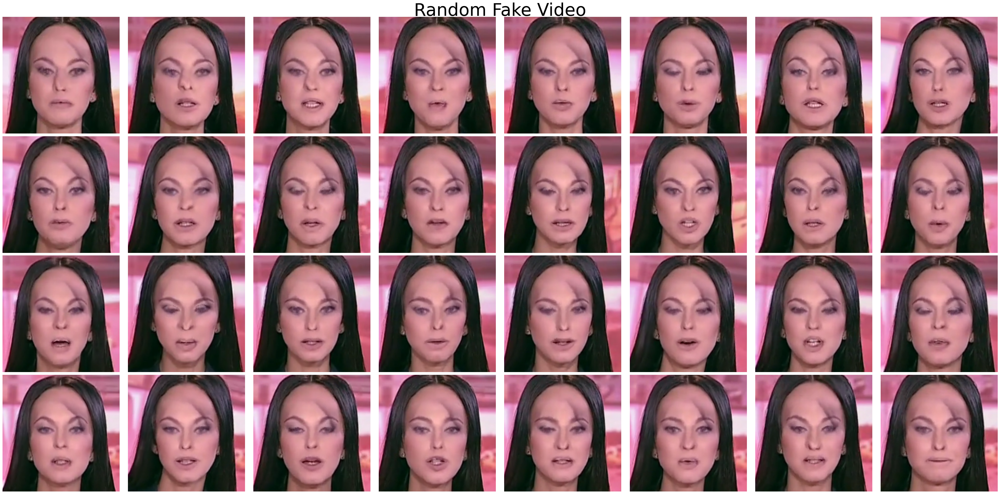

In [14]:
# Fake example
idx = labels.index(1)
example_path = videos[idx]

fig, axs = plt.subplots(4, TOTAL_FRAMES // 4, figsize=(40, 20))
axs = axs.flatten()

for frame, ax in zip(preprocess_video(example_path, TOTAL_FRAMES).numpy().transpose([0, 2, 3, 1]).astype(np.uint8), axs):
    ax.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    ax.axis('off')

fig.suptitle("Random Fake Video", fontsize=50)
plt.tight_layout()
plt.show()

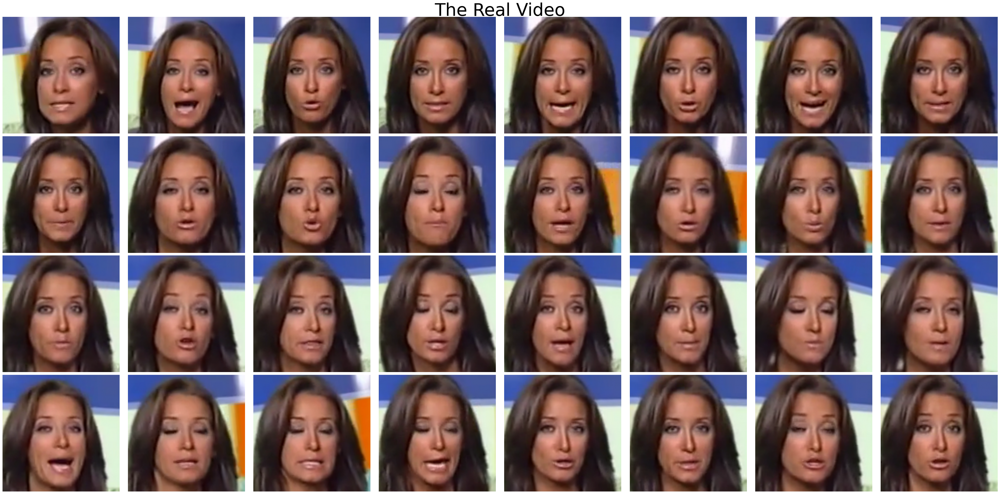

In [15]:
# Random real video. No risk using index because there's always N_DATA real examples. 
real_example = videos[labels.index(0)]

fig, axs = plt.subplots(4, TOTAL_FRAMES // 4, figsize=(40, 20))
axs = axs.flatten()

for frame, ax in zip(preprocess_video(real_example, TOTAL_FRAMES).numpy().transpose([0, 2, 3, 1]).astype(np.uint8), axs):
    ax.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    ax.axis('off')

fig.suptitle("The Real Video", fontsize=50)
plt.tight_layout()
plt.show()

In [16]:
# Getting the test set video paths.
fake_videos, real_videos = [], []

for part in range(10):
    data_part = TEST_DATA_DIR / f"dfdc_train_part_0{part}" / f"dfdc_train_part_{part}"
    meta_path = f"{data_part}/metadata.json"

    with open(meta_path, "r") as f:
        metadata = json.load(f)
    
        for video, info in metadata.items():
            assert info["label"] in ["FAKE", "REAL"]
    
            # No reason why the test set would be paired (each fake example has a real counterpart).
            # So classes are processed and picked independently.
            if info["label"] == "FAKE":
                fake_videos.append(data_part / video)
            else:
                real_videos.append(data_part / video)

print(f"Test dataset contains {len(real_videos)} real videos and {len(fake_videos)} fake ones.")

Test dataset contains 2512 real videos and 17397 fake ones.


In [17]:
# Sampling a random subset of the test data containing N_TEST real examples and N_TEST fake ones.
fake_indices = np.random.permutation(len(fake_videos))[:N_TEST]
real_indices = np.random.permutation(len(real_videos))[:N_TEST]
test_videos = [fake_videos[i] for i in fake_indices] + [real_videos[j] for j in real_indices]

out_test = OUT_DIR / "test"
out_test.mkdir(parents=True, exist_ok=True)
test_frames = preprocess_and_write_frames(test_videos, ["fake", "real"], out_test, N_TEST)
y_test = torch.cat([torch.ones(TOTAL_FRAMES * N_TEST), torch.zeros(TOTAL_FRAMES * N_TEST)], axis = 0).numpy()

In [18]:
test_dict = OrderedDict({str(k.stem): float(v) for k, v in zip(test_frames, y_test)})
with open(out_test / "paths.json", "w") as f:
    json.dump(test_dict, f)